In [1]:
#This is for test the mask generation function
import os
import itertools
import matplotlib
import matplotlib.pyplot as plt

# Change to root path
if os.path.basename(os.getcwd()) != 'Image_Inpainting':
    os.chdir('..')
    
# Import function that generates random masks
from libs.util import MaskGenerator

%matplotlib inline

In [2]:
??MaskGenerator._generate_mask

Signature: MaskGenerator._generate_mask(self)
Source:   
    def _generate_mask(self):
        """Generates a random irregular mask with lines, circles and elipses"""

        img = np.zeros((self.height, self.width, self.channels), np.uint8)

        # Set size scale
        size = int((self.width + self.height) * 0.03)
        if self.width < 64 or self.height < 64:
            raise Exception("Width and Height of mask must be at least 64!")
        
        # Draw random lines
        for _ in range(randint(1, 20)):
            x1, x2 = randint(1, self.width), randint(1, self.width)
            y1, y2 = randint(1, self.height), randint(1, self.height)
            thickness = randint(3, size)
            cv2.line(img,(x1,y1),(x2,y2),(1,1,1),thickness)
            
        # Draw random circles
        for _ in range(randint(1, 20)):
            x1, y1 = randint(1, self.width), randint(1, self.height)
            radius = randint(3, size)
            cv2.circle(img,(x1,y1),radius,(1,1

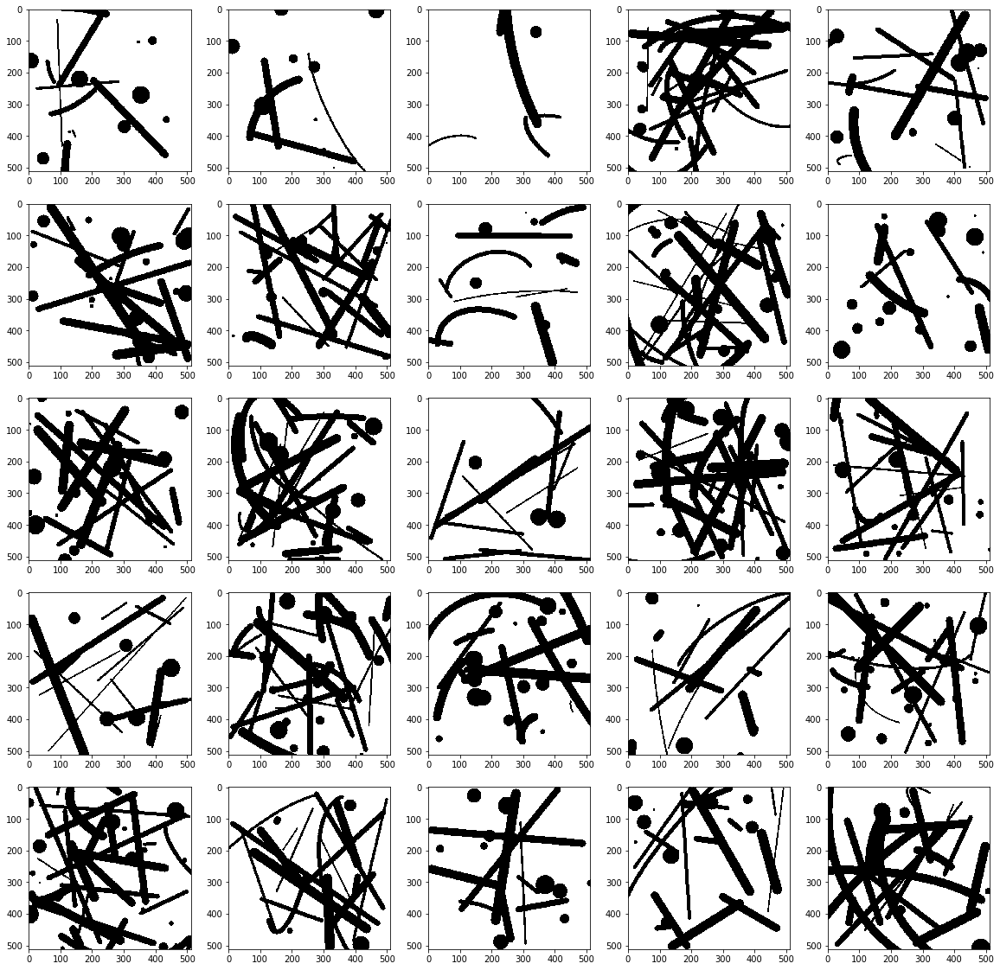

In [3]:
# Instantiate mask generator
mask_generator = MaskGenerator(512, 512, 3, rand_seed=42)

# Plot the results
_, axes = plt.subplots(5, 5, figsize=(20, 20))
axes = list(itertools.chain.from_iterable(axes))

for i in range(len(axes)):
    
    # Generate image
    img = mask_generator.sample()
    
    # Plot image on axis
    axes[i].imshow(img*255)

>> Found 9047 masks in /liujian/Image_Inpainting/data/masks/train


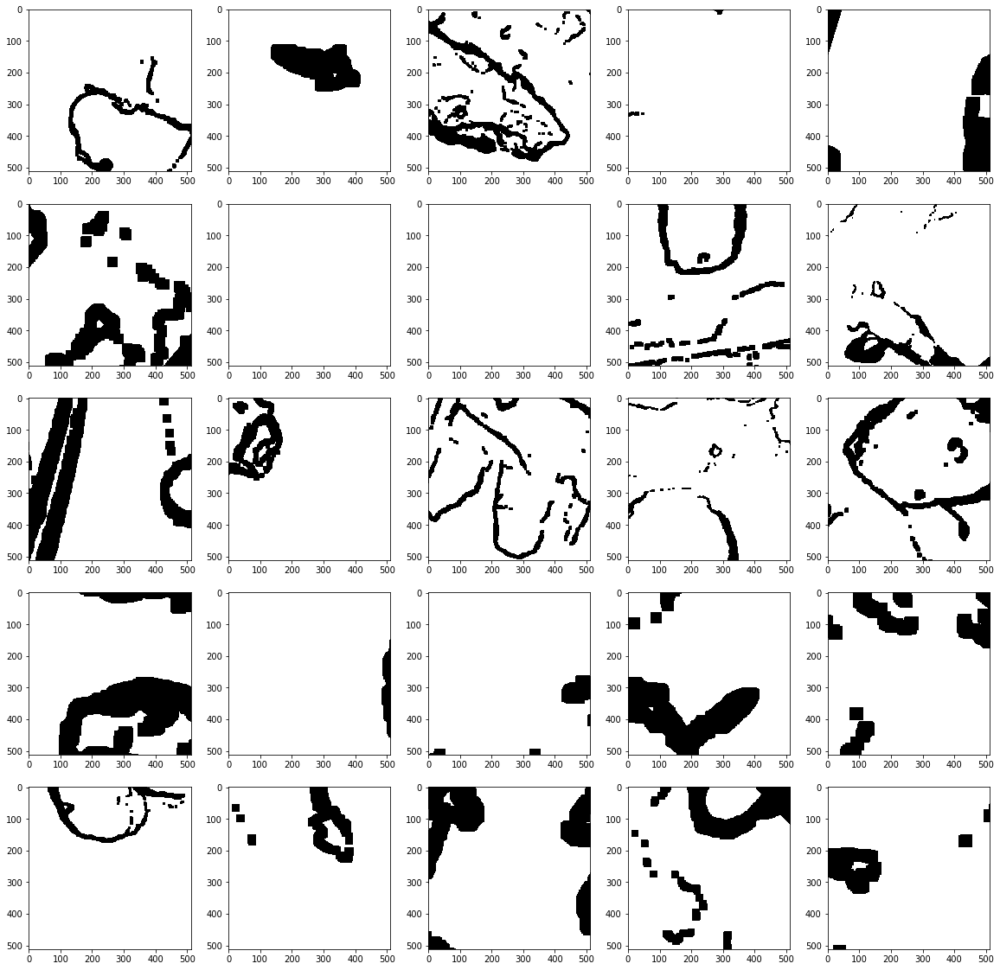

In [4]:
# Here the mask in 'Image_Inpainting/data/masks/train' is gegerated from the 
#original paper(Liu's paper), you can download it from https://nv-adlr.github.io/publication/partialconv-inpainting

mask_generator = MaskGenerator(512, 512, 3, rand_seed=42, filepath='/liujian/Image_Inpainting/data/masks/train')

# Plot the results
_, axes = plt.subplots(5, 5, figsize=(20, 20))
axes = list(itertools.chain.from_iterable(axes))

for i in range(len(axes)):
    
    # Generate image
    img = mask_generator.sample()
    
    # Plot image on axis
    axes[i].imshow(img*255)

In [5]:
#here we implemented the Partial Convolution Layer

import os
from copy import deepcopy
import cv2
from cv2 import cv2
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from keras.layers import Input, Dense, ZeroPadding2D
from keras.models import Model

# Change to root path
if os.path.basename(os.getcwd()) != 'Image_Inpainting':
    os.chdir('..')

# Import modules from libs/ directory
from libs.pconv_layer import PConv2D
from libs.util import MaskGenerator

%matplotlib inline
%load_ext autoreload
%autoreload 2

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [6]:
img.shape

(512, 512, 3)

Shape of image is: (1080, 1440, 3)


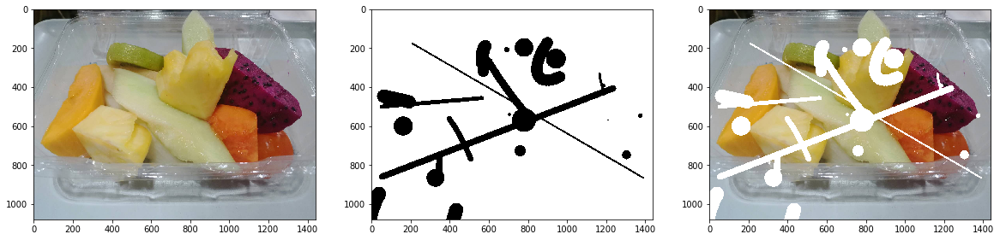

In [7]:
# Load image
img = cv2.imread('/liujian/Image_Inpainting/data/sample_image.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
shape = img.shape
print(f"Shape of image is: {shape}")

# Instantiate mask generator
mask_generator = MaskGenerator(shape[0], shape[1], 3, rand_seed=42)

# Load mask
mask = mask_generator.sample()

# Image + mask
masked_img = deepcopy(img)
masked_img[mask==0] = 255

# Show side by side
_, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(img)
axes[1].imshow(mask*255)
axes[2].imshow(masked_img)
plt.show()

In [8]:
from libs.pconv_layer import PConv2D

# Input images and masks into Partial convolution layer
input_img = Input(shape=(shape[0], shape[1], shape[2],))
input_mask = Input(shape=(shape[0], shape[1], shape[2],))
output_img, output_mask1 = PConv2D(8, kernel_size=(7,7), strides=(2,2))([input_img, input_mask])
output_img, output_mask2 = PConv2D(16, kernel_size=(5,5), strides=(2,2))([output_img, output_mask1])
output_img, output_mask3 = PConv2D(32, kernel_size=(5,5), strides=(2,2))([output_img, output_mask2])
output_img, output_mask4 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask3])
output_img, output_mask5 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask4])
output_img, output_mask6 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask5])
output_img, output_mask7 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask6])
output_img, output_mask8 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask7])

# Create model
model = Model(
    inputs=[input_img, input_mask], 
    outputs=[
        output_img, output_mask1, output_mask2, 
        output_mask3, output_mask4, output_mask5,
        output_mask6, output_mask7, output_mask8
    ])
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

# Show summary of the model
model.summary()






__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1080, 1440, 3 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1080, 1440, 3 0                                            
__________________________________________________________________________________________________
p_conv2d_1 (PConv2D)            [(None, 540, 720, 8) 1184        input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
p_conv2d_2 (PConv2D)            [(None, 270, 360, 16 3216        p_conv2d_1[0][0]                 
     

In [9]:
formatted_img = np.expand_dims(masked_img, 0) / 255
formatted_mask = np.expand_dims(mask, 0)
print(f"Original Mask Shape: {formatted_mask.shape} - Max value in mask: {np.max(formatted_mask)}")

output_img, o1, o2, o3, o4, o5, o6, o7, o8 = model.predict([formatted_img, formatted_mask])

Original Mask Shape: (1, 1080, 1440, 3) - Max value in mask: 1



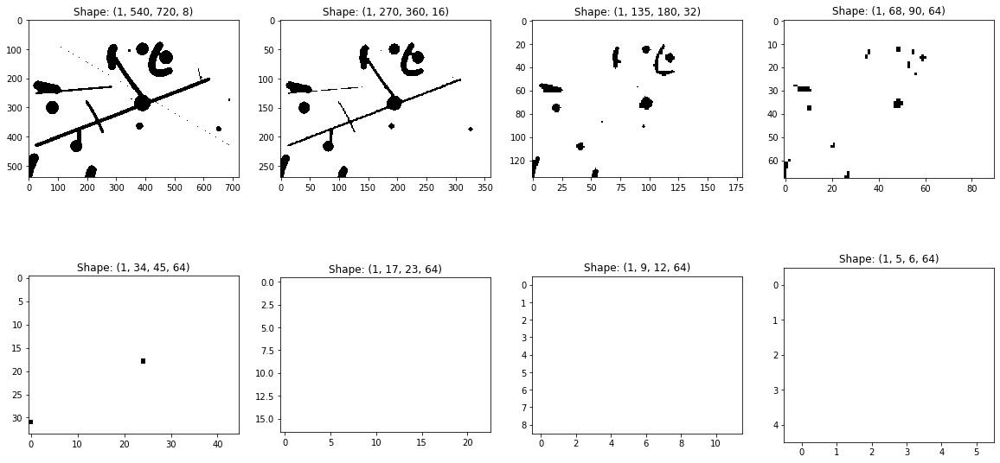

In [10]:
_, axes = plt.subplots(2, 4, figsize=(20, 10))
axes[0][0].imshow(o1[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][1].imshow(o2[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][2].imshow(o3[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][3].imshow(o4[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][0].imshow(o5[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][1].imshow(o6[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][2].imshow(o7[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][3].imshow(o8[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][0].set_title(f"Shape: {o1.shape}")
axes[0][1].set_title(f"Shape: {o2.shape}")
axes[0][2].set_title(f"Shape: {o3.shape}")
axes[0][3].set_title(f"Shape: {o4.shape}")
axes[1][0].set_title(f"Shape: {o5.shape}")
axes[1][1].set_title(f"Shape: {o6.shape}")
axes[1][2].set_title(f"Shape: {o7.shape}")
axes[1][3].set_title(f"Shape: {o8.shape}")
plt.show()

In [11]:
#here we implemente the U-Net Architecture

import os
import gc
import copy

import numpy as np
from PIL import Image

from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import TensorBoard, ModelCheckpoint, LambdaCallback

import matplotlib
import matplotlib.pyplot as plt

# Change to root path
if os.path.basename(os.getcwd()) != 'Image_Inpainting':
    os.chdir('..')

from libs.util import MaskGenerator
from libs.pconv_model import PConvUnet

# Settings
BATCH_SIZE = 4

# Imagenet Rescaling
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
PConvUnet().summary()




__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inputs_img (InputLayer)         (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
inputs_mask (InputLayer)        (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
p_conv2d_9 (PConv2D)            [(None, 256, 256, 64 9472        inputs_img[0][0]                 
                                                                 inputs_mask[0][0]                
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 256, 256, 64) 0           p_conv2d_9[0][0]                 
_______

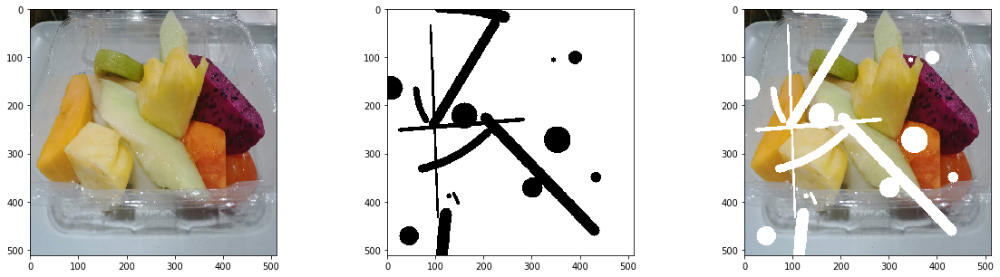

In [13]:
'''
For the purpose of checking whether the model works, we tried training the network on a single image; 
training and test dataset will essentially be the same, but this is simply to validate that the network learns something.
'''

# Instantiate mask generator
mask_generator = MaskGenerator(512, 512, 3, rand_seed=42)

# Load image
img = np.array(Image.open('/liujian/Image_Inpainting/data/sample_image.jpg').resize((512, 512))) / 255

# Load mask
mask = mask_generator.sample()

# Image + mask
masked_img = copy.deepcopy(img)
masked_img[mask==0] = 1

# Show side by side
_, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(img)
axes[1].imshow(mask*255)
axes[2].imshow(masked_img)
plt.show()

In [14]:
'''
In this simple testing case we only be testing the architecture on a single image to see how it performs. 
We created a generator that will infinitely yield the same image and masked_image for us, 
except each each yielded image will be slightly altered/augmented by using ImageDataGenerator from keras.processing
'''

def plot_sample_data(masked, mask, ori, middle_title='Raw Mask'):
    _, axes = plt.subplots(1, 3, figsize=(20, 5))
    axes[0].imshow(masked[:,:,:])
    axes[0].set_title('Masked Input')
    axes[1].imshow(mask[:,:,:])
    axes[1].set_title(middle_title)
    axes[2].imshow(ori[:,:,:])
    axes[2].set_title('Target Output')
    plt.show()

class DataGenerator(ImageDataGenerator):
    def flow(self, x, *args, **kwargs):
        while True:
            
            # Get augmentend image samples
            ori = next(super().flow(x, *args, **kwargs))

            # Get masks for each image sample
            mask = np.stack([mask_generator.sample() for _ in range(ori.shape[0])], axis=0)

            # Apply masks to all image sample
            masked = copy.deepcopy(ori)
            masked[mask==0] = 1

            # Yield ([ori, masl],  ori) training batches
            # print(masked.shape, ori.shape)
            gc.collect()
            yield [masked, mask], ori        

# Create datagen
datagen = DataGenerator(  
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

# Create generator from numpy array
batch = np.stack([img for _ in range(BATCH_SIZE)], axis=0)
generator = datagen.flow(x=batch, batch_size=BATCH_SIZE)

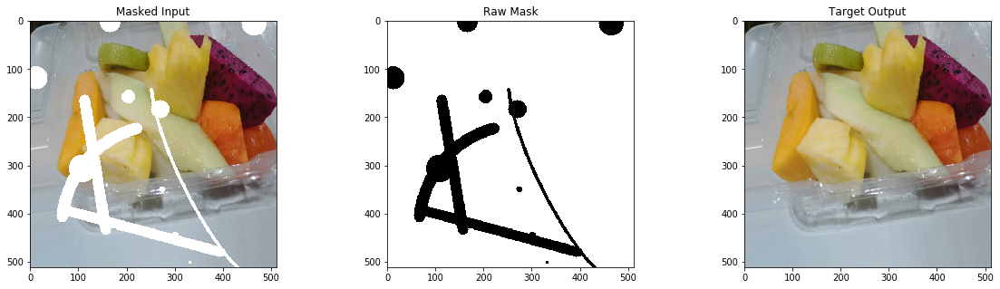

In [15]:
[m1, m2], o1 = next(generator)
plot_sample_data(m1[0], m2[0]*255, o1[0])

In [17]:
# Instantiate model
'''
we implemented the original model from classic Unet network with vgg16 device, 
vgg_device: In case of training with multiple GPUs, specify which device to run VGG inference on.
'''
# 
model = PConvUnet(vgg_weights='/liujian/Image_Inpainting/data/logs/vgg16.h5')

Epoch 1/20
2000/2000 [==============================] - 877s 438ms/step - loss: 2.3946 - PSNR: 17.6076


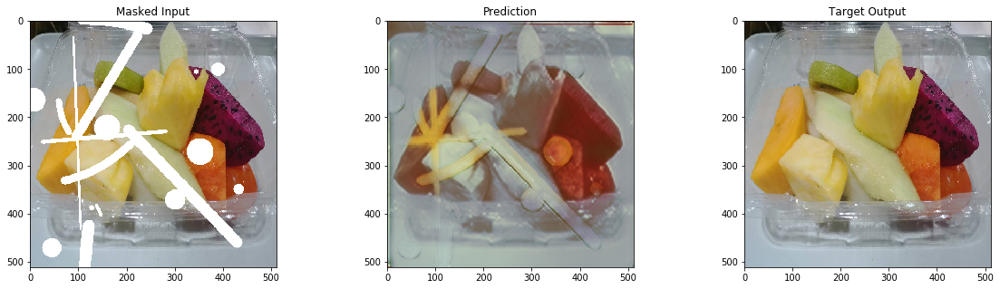

Epoch 2/20
2000/2000 [==============================] - 906s 453ms/step - loss: 1.2308 - PSNR: 21.5784


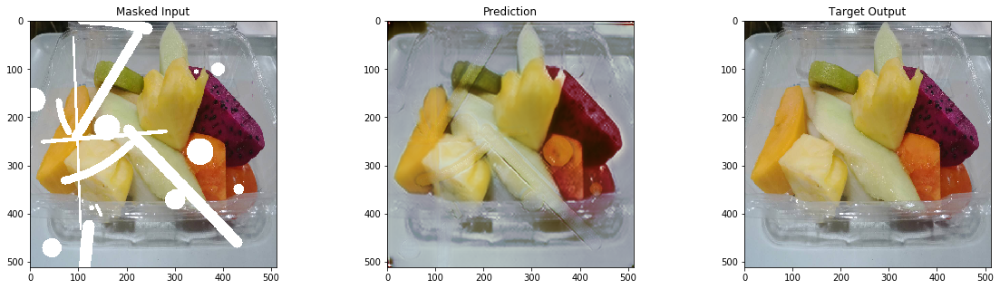

Epoch 3/20
2000/2000 [==============================] - 917s 459ms/step - loss: 0.9763 - PSNR: 24.9007


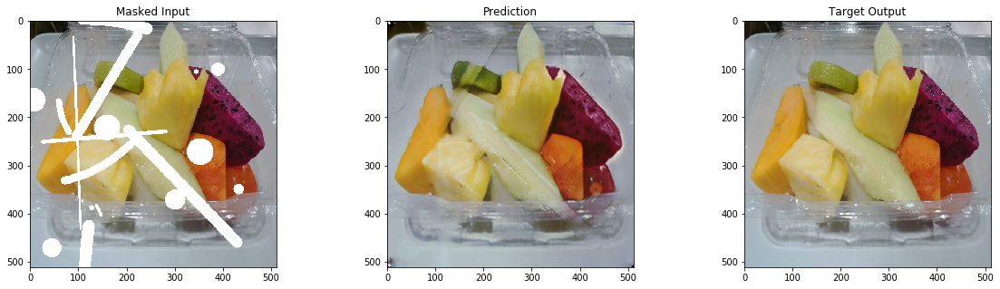

Epoch 4/20
2000/2000 [==============================] - 924s 462ms/step - loss: 0.8584 - PSNR: 25.7310


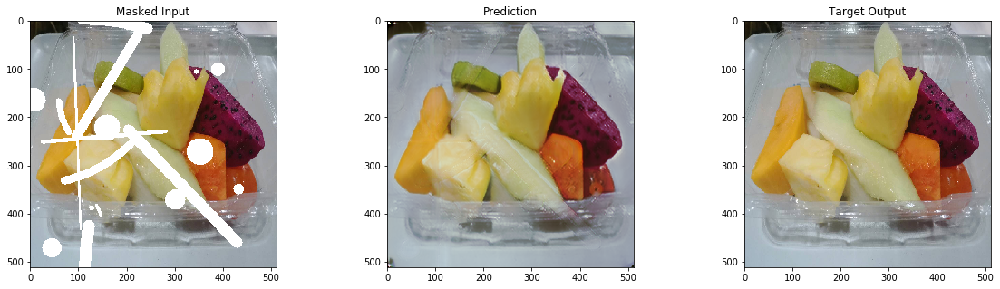

Epoch 5/20
2000/2000 [==============================] - 906s 453ms/step - loss: 0.7820 - PSNR: 26.4644


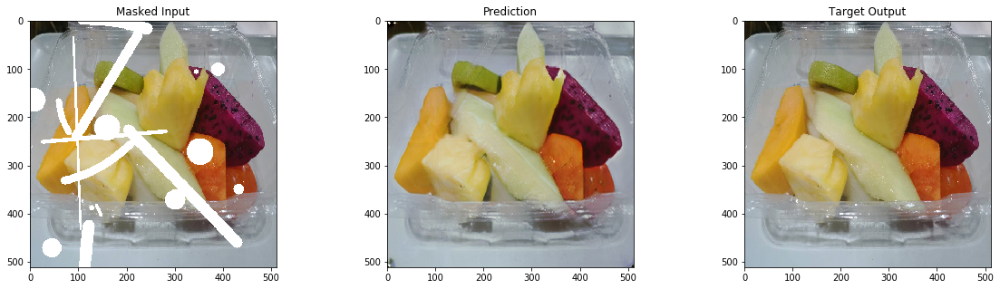

Epoch 6/20
2000/2000 [==============================] - 898s 449ms/step - loss: 0.7323 - PSNR: 26.8259


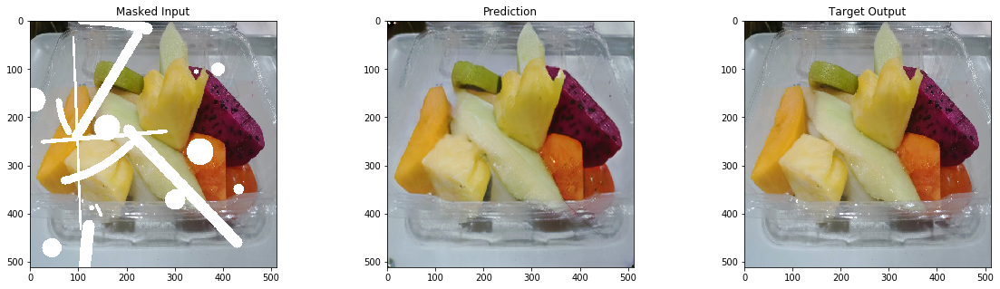

Epoch 7/20
2000/2000 [==============================] - 880s 440ms/step - loss: 0.6899 - PSNR: 27.1386


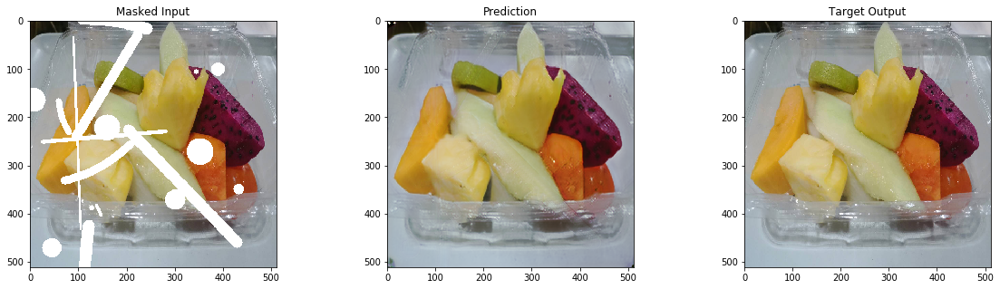

Epoch 8/20
2000/2000 [==============================] - 918s 459ms/step - loss: 0.6596 - PSNR: 27.3886


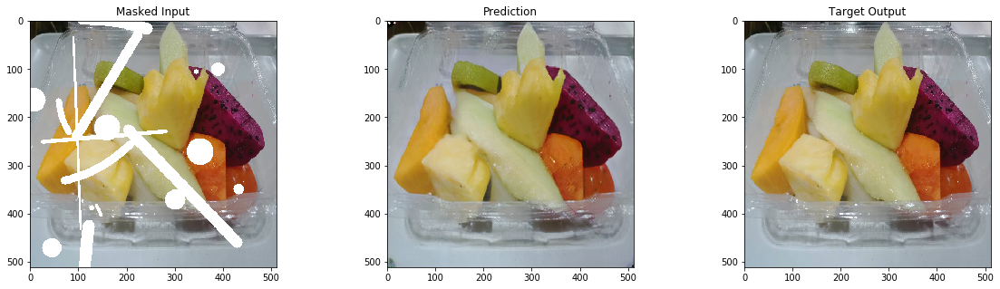

Epoch 9/20
2000/2000 [==============================] - 891s 446ms/step - loss: 0.6299 - PSNR: 27.6579


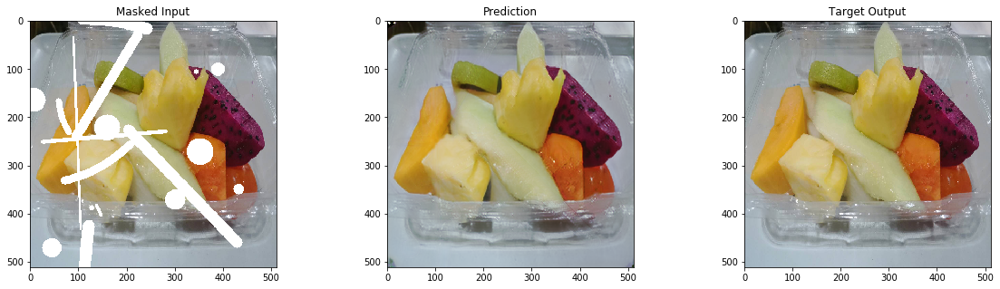

Epoch 10/20
2000/2000 [==============================] - 900s 450ms/step - loss: 0.6078 - PSNR: 27.9072


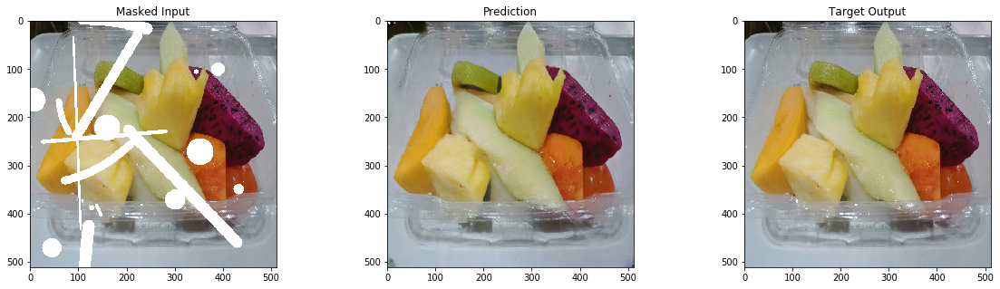

Epoch 11/20
2000/2000 [==============================] - 856s 428ms/step - loss: 0.5858 - PSNR: 28.1505


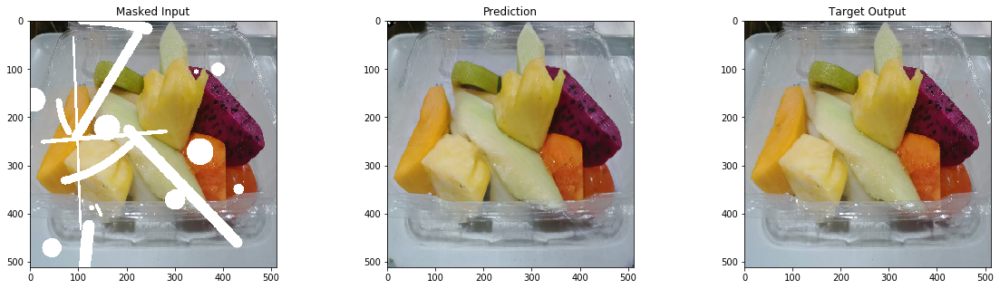

Epoch 12/20
2000/2000 [==============================] - 866s 433ms/step - loss: 0.5697 - PSNR: 28.3635


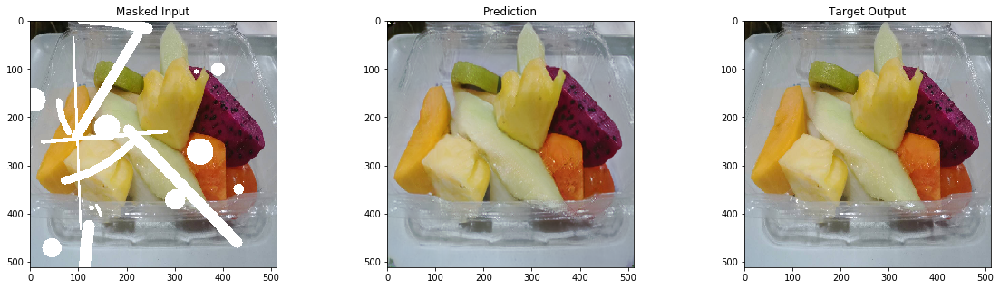

Epoch 13/20
2000/2000 [==============================] - 887s 444ms/step - loss: 0.5540 - PSNR: 28.5576


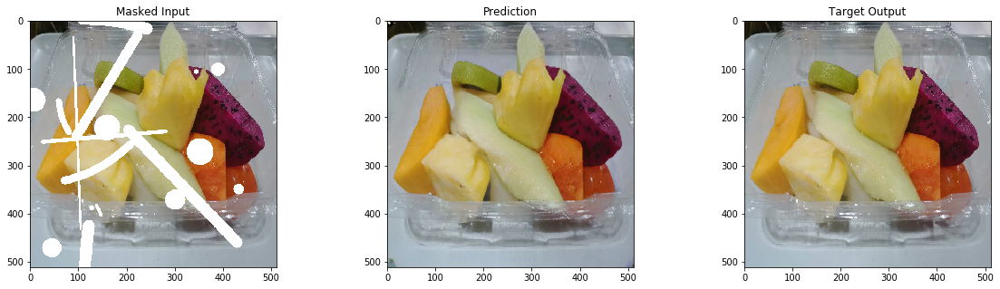

Epoch 14/20
2000/2000 [==============================] - 870s 435ms/step - loss: 0.5390 - PSNR: 28.7255


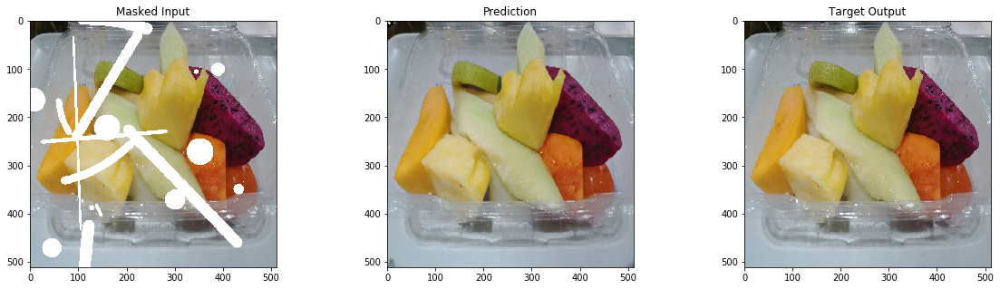

Epoch 15/20
2000/2000 [==============================] - 857s 429ms/step - loss: 0.5262 - PSNR: 28.9189


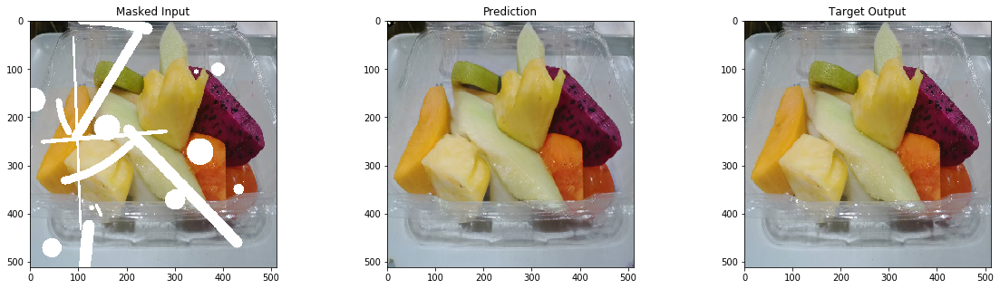

Epoch 16/20
2000/2000 [==============================] - 908s 454ms/step - loss: 0.5166 - PSNR: 29.0387


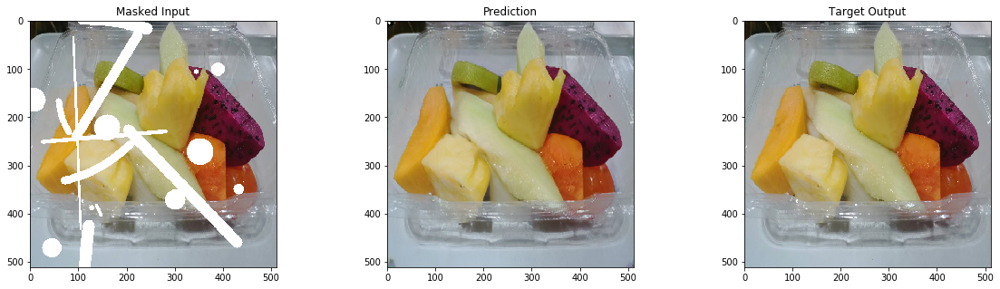

Epoch 17/20
2000/2000 [==============================] - 902s 451ms/step - loss: 0.5030 - PSNR: 29.2148


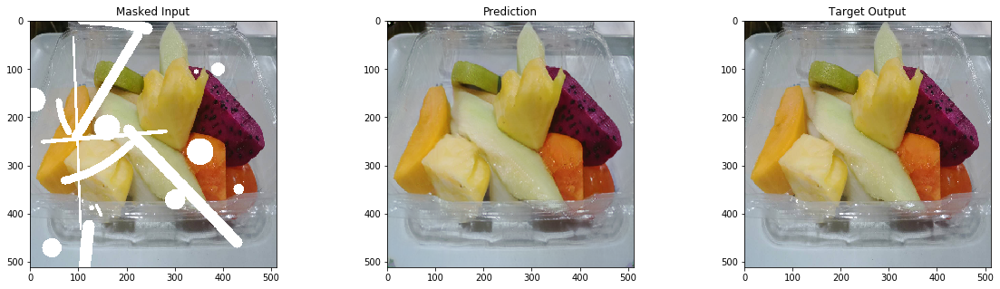

Epoch 18/20
2000/2000 [==============================] - 889s 444ms/step - loss: 0.4946 - PSNR: 29.3481


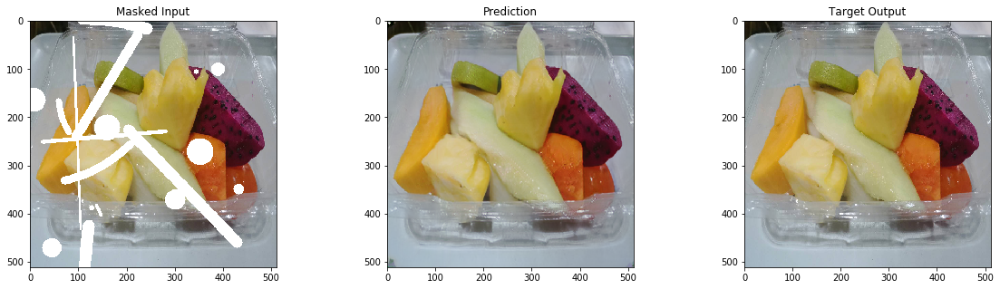

Epoch 19/20
2000/2000 [==============================] - 888s 444ms/step - loss: 0.4859 - PSNR: 29.4981


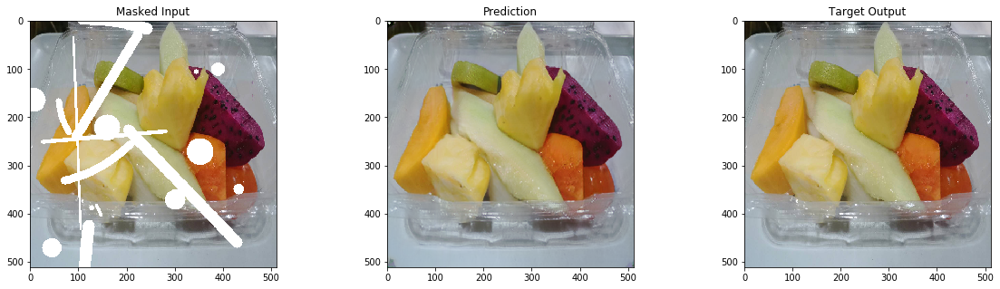

Epoch 20/20
2000/2000 [==============================] - 914s 457ms/step - loss: 0.4792 - PSNR: 29.6215


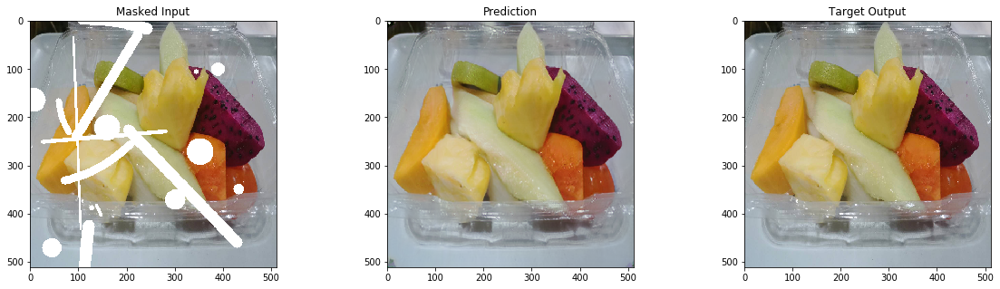

In [20]:
'''
Now that we have a generator, we can initiate our training. 
For conveience the fit() method of the PConvUnet takes a callback, 
which we can use to evaluate and display the progress in terms of reconstructing the target based on the masked input.
'''

model.fit_generator(
    generator, 
    steps_per_epoch=2000,
    epochs=20,
    callbacks=[
        TensorBoard(
            log_dir='/liujian/Image_Inpainting/data/logs/single_image_test',
            write_graph=False
        ),
        ModelCheckpoint(
            '/liujian/Image_Inpainting/data/logs/single_image_test/weights.{epoch:02d}-{loss:.2f}.h5',
            monitor='loss', 
            save_best_only=True, 
            save_weights_only=True
        ),
        LambdaCallback(
            on_epoch_end=lambda epoch, logs: plot_sample_data(
                masked_img, 
                model.predict(
                    [
                        np.expand_dims(masked_img,0), 
                        np.expand_dims(mask,0)
                    ]
                )[0]
                , 
                img,
                middle_title='Prediction'
            )
        )
    ],
)

In [5]:
import os
import gc
import datetime
import numpy as np
import pandas as pd
import cv2

from copy import deepcopy
from tqdm import tqdm

from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import TensorBoard, ModelCheckpoint, LambdaCallback
from keras import backend as K
from keras.utils import Sequence
from keras_tqdm import TQDMNotebookCallback

import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
from IPython.display import clear_output

# Change to root path
if os.path.basename(os.getcwd()) != 'Image_Inpainting':
    os.chdir('..')

from libs.pconv_model import PConvUnet
from libs.util import MaskGenerator

%load_ext autoreload
%autoreload 2
plt.ioff()

# SETTINGS

# you can train your own dataset by reset the dir:

TRAIN_DIR = '/liujian/GCPANet_trainset/train/DUT-OMRON'
VAL_DIR = '/liujian/Image_Inpainting/data/Val'
TEST_DIR ='/liujian/Image_Inpainting/data/Test'

BATCH_SIZE = 4

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [6]:
class AugmentingDataGenerator(ImageDataGenerator):
    def flow_from_directory(self, directory, mask_generator, *args, **kwargs):
#         generator = super().flow_from_directory(directory, class_mode=None, *args, **kwargs)
#         seed = 16
        seed = None if 'seed' not in kwargs else kwargs['seed']
        while True:
            # Get augmentend image samples
            ori = next(super().flow_from_directory(directory, class_mode=None, *args, **kwargs))
#             print(ori)
            # Get masks for each image sample            
            mask = np.stack([
                mask_generator.sample(seed)
                for _ in range(ori.shape[0])], axis=0
            )
            
#             print(masked.shape, ori.shape)

            # Apply masks to all image sample
            masked = deepcopy(ori)
            masked[mask==0] = 1

            # Yield ([ori, masl],  ori) training batches
            
            gc.collect()
            yield [masked, mask], ori
            



In [7]:
# Create training generator
train_datagen = AugmentingDataGenerator(  
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR, 
    MaskGenerator(512, 512, 3),
    target_size=(512, 512), 
    batch_size=BATCH_SIZE
)

# Create validation generator
val_datagen = AugmentingDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(
    VAL_DIR, 
    MaskGenerator(512, 512, 3), 
    target_size=(512, 512), 
    batch_size=BATCH_SIZE, 
    classes=['val'], 
    seed=42
)

# Create testing generator
test_datagen = AugmentingDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR, 
    MaskGenerator(512, 512, 3), 
    target_size=(512, 512), 
    batch_size=BATCH_SIZE, 
    seed=42
)

Found 2043 images belonging to 1 classes.


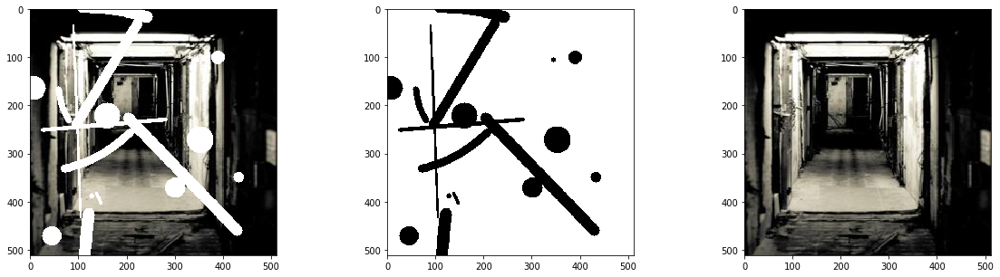

In [10]:
# Pick out an example
test_data = next(test_generator)
(masked, mask), ori = test_data

# Show side by side
for i in range(len(ori)):
    _, axes = plt.subplots(1, 3, figsize=(20, 5))
    axes[0].imshow(masked[i,:,:,:])
    axes[1].imshow(mask[i,:,:,:] * 1.)
    axes[2].imshow(ori[i,:,:,:])
    plt.show()

In [11]:
def plot_callback(model):
    """Called at the end of each epoch, displaying our previous test images,
    as well as their masked predictions and saving them to disk"""
    
    # Get samples & Display them        
    pred_img = model.predict([masked, mask])
    pred_time = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M-%S')

    # Clear current output and display test images
    for i in range(len(ori)):
        _, axes = plt.subplots(1, 3, figsize=(20, 5))
        axes[0].imshow(masked[i,:,:,:])
        axes[1].imshow(pred_img[i,:,:,:] * 1.)
        axes[2].imshow(ori[i,:,:,:])
        axes[0].set_title('Masked Image')
        axes[1].set_title('Predicted Image')
        axes[2].set_title('Original Image')
                
        plt.savefig(r'/liujian/Image_Inpainting/data/test_samples/img_{}_{}.png'.format(i, pred_time))
        plt.close()

In [12]:
# Instantiate the model
#WITH BATCH NORMALIZATION_________________________________________________________________________________________
model = PConvUnet(vgg_weights='/liujian/Image_Inpainting/data/logs/pytorch_to_keras_vgg16.h5')
model.load("/liujian/Image_Inpainting/data/logs/single_image_test/weights.20-0.48.h5")# TODO: load the test trained weights(we trined before with one picture)

In [ ]:
FOLDER = '/liujian/Image_Inpainting/data/logs/places_phase1_paperMasks'

# Run training for certain amount of epochs
# Save the model
model.fit_generator(
    train_generator, 
    steps_per_epoch=2000,
    validation_data=val_generator,
    validation_steps=1000,
    epochs=100,  
    verbose=0,
    callbacks=[
        TensorBoard(
            log_dir=FOLDER,
            write_graph=False
        ),
        ModelCheckpoint(
            FOLDER+'weights.{epoch:02d}-{loss:.2f}.h5',
            monitor='val_loss', 
            save_best_only=True, 
            save_weights_only=True
        ),
        LambdaCallback(
            on_epoch_end=lambda epoch, logs: plot_callback(model)
        ),
        TQDMNotebookCallback()
    ]
)

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.Found 5177 images belonging to 2 classes.

Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.Found 2027 images belonging to 1 classes.

Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 classes.
Found 5177 images belonging to 2 c

Found 2027 images belonging to 1 classes.
Found 5178 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5178 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5178 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 2027 images belonging to 1 classes.
Found 5178 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5178 images belonging to 2 classes.
Found 2027 images belonging to 1 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 classes.
Found 5178 images belonging to 2 c

In [ ]:
#WITHOUT BATCH NORMALIZATION_________________________________________________________________________________________
# Load weights from previous run
model = PConvUnet(vgg_weights='/liujian/Image_Inpainting/data/logs/pytorch_to_keras_vgg16.h5')
model.load(
    r"/liujian/Image_Inpainting/data/logs/single_image_test/weights.20-0.48.h5",
    train_bn=False,
    lr=0.00005
)


In [ ]:
# Run training for certain amount of epochs
model.fit_generator(
    train_generator, 
    steps_per_epoch=1000,
    validation_data=val_generator,
    validation_steps=1000,
    epochs=100,  
    verbose=0,
    callbacks=[
        TensorBoard(
            log_dir='/liujian/Image_Inpainting/data/logs/imagenet_phase2',
            write_graph=False
        ),
        ModelCheckpoint(
            '/liujian/Image_Inpainting/data/logs/imagenet_phase2/weights.{epoch:02d}-{loss:.2f}.h5',
            monitor='val_loss', 
            save_best_only=True, 
            save_weights_only=True
        ),
        LambdaCallback(
            on_epoch_end=lambda epoch, logs: plot_callback(model)
        ),
        TQDMNotebookCallback()
    ]
)

In [ ]:
# Load weights from previous run
model = PConvUnet()
model.load(
    r"C:\Users\Mathias Felix Gruber\Documents\GitHub\PConv-Keras\data\logs\imagenet_phase2\weights.26-1.07.h5",
    train_bn=False,
    lr=0.00005
)

In [ ]:
n = 0
for (masked, mask), ori in tqdm(test_generator):
    
    # Run predictions for this batch of images
    pred_img = model.predict([masked, mask])
    pred_time = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
    
    # Clear current output and display test images
    for i in range(len(ori)):
        _, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(masked[i,:,:,:])
        axes[1].imshow(pred_img[i,:,:,:] * 1.)
        axes[0].set_title('Masked Image')
        axes[1].set_title('Predicted Image')
        axes[0].xaxis.set_major_formatter(NullFormatter())
        axes[0].yaxis.set_major_formatter(NullFormatter())
        axes[1].xaxis.set_major_formatter(NullFormatter())
        axes[1].yaxis.set_major_formatter(NullFormatter())
                
        plt.savefig(r'/liujian/Image_Inpainting/data/test_samples/img_{}_{}.png'.format(i, pred_time))
        plt.close()
        n += 1
        
    # Only create predictions for about 100 images
    if n > 100:
        break

In [ ]:
'''
To evaluate the performance of the network, in this notebook we loaded the test masks used in the original paper,
and see which PSNR scores we get on imagenet
'''
# Store data
ratios = []
psnrs = []

# Loop through test masks released with paper
test_masks = os.listdir('/liujian/Image_Inpainting/data/masks/test')
for filename in tqdm(test_masks):
    
    # Load mask from paper
    filepath = os.path.join('/liujian/Image_Inpainting/data/masks/test', filename)
    mask = cv2.imread(filepath) / 255
    ratios.append(mask[:,:,0].sum() / (512 * 512))
    mask = np.array([1-mask for _ in range(BATCH_SIZE)])
    
    # Pick out image from test generator
    test_data = next(val_generator)
    (_, _), ori = test_data
    
    masked = deepcopy(ori)
    masked[mask==0] = 1
    
    # Run prediction on image & mask
    pred = model.predict([ori, mask])
    
    # Calculate PSNR
    psnrs.append(-10.0 * np.log10(np.mean(np.square(pred - ori))))

In [ ]:
df = pd.DataFrame({'ratios': ratios[:2408], 'psnrs': psnrs})

means, stds = [], []
idx1 = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5]
idx2 = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

for mi, ma in zip(idx1, idx2):
    means.append(df[(df.ratios >= mi) & (df.ratios <= ma)].mean())
    stds.append(df[(df.ratios >= mi) & (df.ratios <= ma)].std())
    
pd.DataFrame(means, index=['{}-{}'.format(a, b) for a, b in zip(idx1, idx2)])